# 3D Style Transfer



## Install, Import, Initialize OpenGL, and load a CNN model

This notebook uses OpenGL and thus **requires** a GPU, unlikely most of  our notebooks.
You can check whether your GPU is available and configured correctly for tensorflow:

In [113]:
import tensorflow as tf
import os
import io
import sys
from string import Template
from pathlib import Path
from ctypes.util import find_library


import numpy as np
import PIL.Image
import matplotlib.pylab as pl

from IPython.display import clear_output, display, Image, HTML

from lucid.misc.gl.glcontext import create_opengl_context
import OpenGL.GL as gl

from lucid.misc.gl import meshutil
from lucid.misc.gl import glrenderer
import lucid.misc.io.showing as show
import lucid.misc.io as lucid_io
from lucid.misc.tfutil import create_session

from lucid.modelzoo import vision_models
from lucid.optvis import objectives
from lucid.optvis import param
from lucid.optvis.style import StyleLoss, mean_l1_loss
from lucid.optvis.param.spatial import sample_bilinear

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'



create_opengl_context()
gl.glGetString(gl.GL_VERSION)

model = vision_models.InceptionV1()
model.load_graphdef()

## Loading 3D model

Let's download some 3D models first. You can put the path to your model/texture here, and also the size of the texture

In [114]:
TEXTURE_SIZE = 2048

path_to_model = 'data/Mushroom_01.obj'
path_to_texture = 'data/Mushroom_Top_DIFF.png'

In [115]:
def prepare_image(fn, size=None):
  data = lucid_io.reading.read(fn)
  im = PIL.Image.open(io.BytesIO(data)).convert('RGB')
  if size:
    im = im.resize(size, PIL.Image.ANTIALIAS)
  return np.float32(im)/255.0

mesh = meshutil.load_obj(path_to_model)
mesh = meshutil.normalize_mesh(mesh)

original_texture = prepare_image(path_to_texture, (TEXTURE_SIZE, TEXTURE_SIZE))

## Change the link of style_url to download the style image


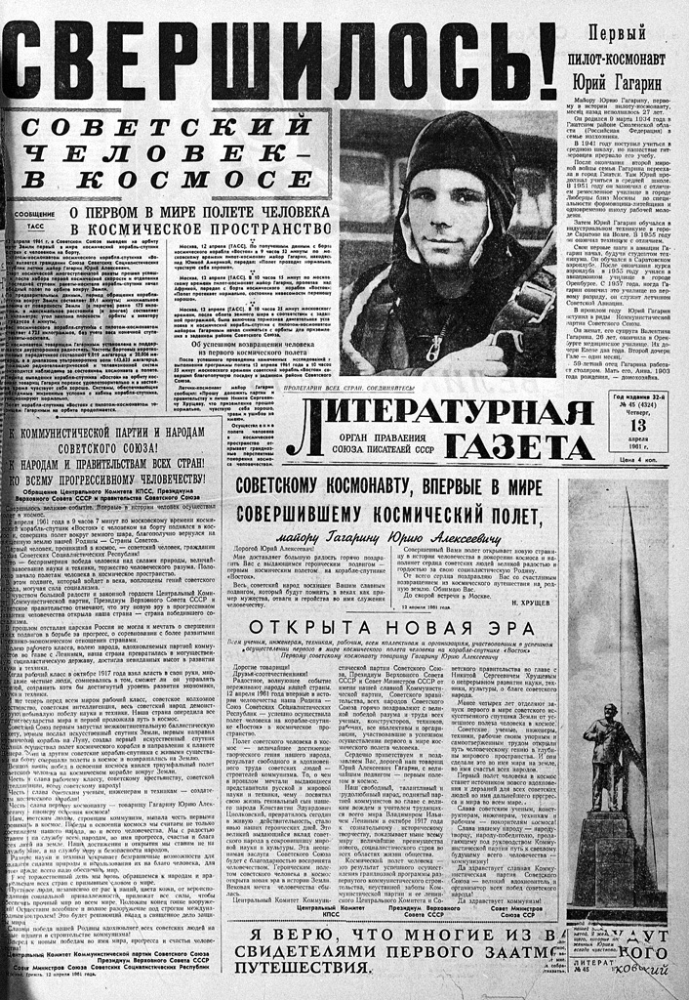

In [116]:
style_url = 'https://upload.wikimedia.org/wikipedia/commons/d/db/RIAN_archive_409362_Literaturnaya_Gazeta_article_about_YuriGagarin%2C_first_man_in_space.jpg'
style = prepare_image(style_url)
show.image(style, 'jpeg')

## Texture Synthesis

In [123]:
renderer = glrenderer.MeshRenderer((512, 512))

In [124]:
googlenet_style_layers = [
    'conv2d2',
    'mixed3a',
    'mixed3b',
    'mixed4a',
    'mixed4b',
    'mixed4c',
]

googlenet_content_layer = 'mixed3b'

# Change the number of iterations

#### The new texture starts from random noise. During each iterations, the network impose the style and content desired. Too few iterations will leave the texture noisy. Too many creates some disturbing style. You can increase or decrease them here

In [125]:
iterations = 200

# Define style transfer functions

In [126]:
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

content_weight = 100.0
# Style Gram matrix weighted average decay coefficient
style_decay = 0.95

sess = create_session(timeout_sec=0)

# t_fragments is used to feed rasterized UV coordinates for the current view.
# Channels: [U, V, _, Alpha]. Alpha is 1 for pixels covered by the object, and
# 0 for background.
t_fragments = tf.placeholder(tf.float32, [None, None, 4])
t_uv = t_fragments[...,:2]
t_alpha = t_fragments[...,3:]

# Texture atlas to optimize
t_texture = param.image(TEXTURE_SIZE, fft=True, decorrelate=True)[0]

# Variable to store the original mesh texture used to render content views
content_var = tf.Variable(tf.zeros([TEXTURE_SIZE, TEXTURE_SIZE, 3]), trainable=False)

# Sample current and original textures with provided pixel data
t_joined_texture = tf.concat([t_texture, content_var], -1)
t_joined_frame = sample_bilinear(t_joined_texture, t_uv) * t_alpha
t_frame_current, t_frame_content = t_joined_frame[...,:3], t_joined_frame[...,3:]
t_joined_frame = tf.stack([t_frame_current, t_frame_content], 0)

# Feeding the rendered frames to the Neural Network
t_input = tf.placeholder_with_default(t_joined_frame, [None, None, None, 3])
model.import_graph(t_input)

# style loss
style_layers = [sess.graph.get_tensor_by_name('import/%s:0'%s)[0] for s in googlenet_style_layers]
# L1-loss seems to be more stable for GoogleNet
# Note that we use style_decay>0 to average style-describing Gram matrices
# over the recent viewports. Please refer to StyleLoss for the details.
sl = StyleLoss(style_layers, style_decay, loss_func=mean_l1_loss)

# content loss
content_layer = sess.graph.get_tensor_by_name('import/%s:0'%googlenet_content_layer)
content_loss = mean_l1_loss(content_layer[0], content_layer[1]) * content_weight

# setup optimization
total_loss = content_loss + sl.style_loss
t_lr = tf.constant(0.05)
trainer = tf.train.AdamOptimizer(t_lr)
train_op = trainer.minimize(total_loss)

init_op = tf.global_variables_initializer()
loss_log = []

def reset(style_img, content_texture):
  del loss_log[:]
  init_op.run()
  sl.set_style({t_input: style_img[None,...]})
  content_var.load(content_texture)

def run(mesh, step_n=iterations):
  for i in range(step_n):
    fragments = renderer.render_mesh(
        modelview=meshutil.sample_view(10.0, 12.0),
        position=mesh['position'], uv=mesh['uv'],
        face=mesh['face'])
    _, loss = sess.run([train_op, [content_loss, sl.style_loss]], {t_fragments: fragments})
    loss_log.append(loss)
    if i==0 or (i+1)%50 == 0:
      clear_output()
      last_frame, last_content = sess.run([t_frame_current, t_frame_content], {t_fragments: fragments})
      show.images([last_frame, last_content], ['current frame', 'content'])
    if i==0 or (i+1)%10 == 0:
      print(len(loss_log), loss)


/home/federico/.pyenv/versions/3.7.7/envs/style2/lib/python3.7/site-packages/tensorflow_core/python/client/session.py:1750: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [128]:
## Reset model (it cancel the previous generated texture)
reset(style, original_texture)

### Create texture (this will take some time)


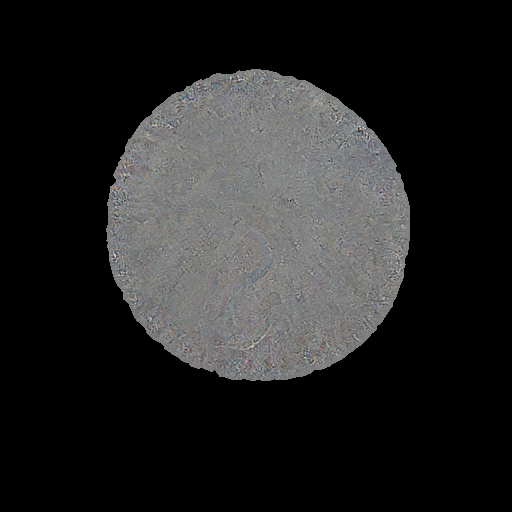
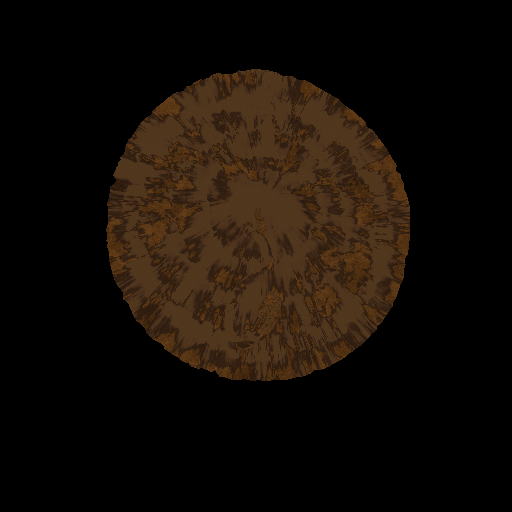

1 [519.969, 3373.2727]


KeyboardInterrupt: 

In [129]:
run(mesh)


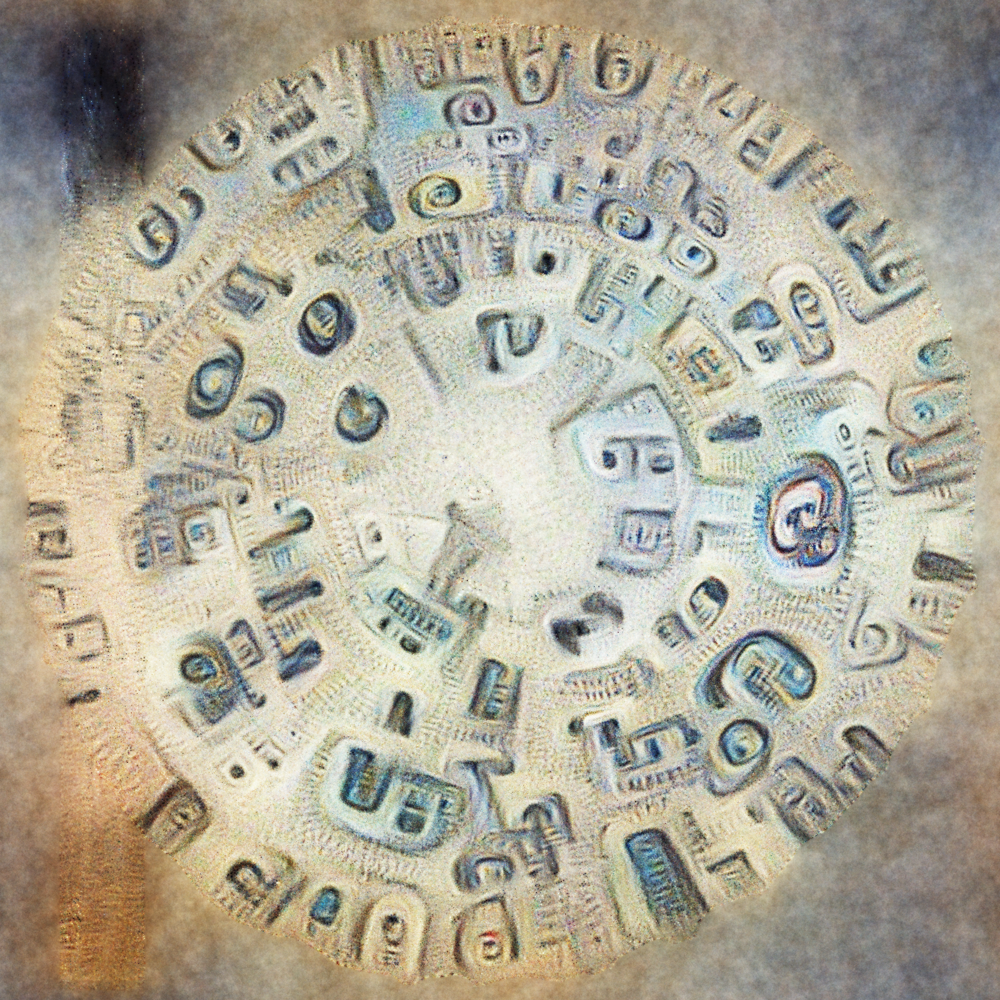

In [57]:
show.image(texture, 'jpeg')